In [1]:
# Select which Poland Case to parse
using PowerModels
using Ipopt

# sys = PowerModels.parse_file("case14.m")

# sys = PowerModels.parse_file("case2383wp.m")
sys = PowerModels.parse_file("case2383wp-Islanded.m")

[warn | PowerModels]: this code only supports angmin values in -90 deg. to 90 deg., tightening the value on branch 2243 from -360.0 to -60.0 deg.
[warn | PowerModels]: this code only supports angmax values in -90 deg. to 90 deg., tightening the value on branch 2243 from 360.0 to 60.0 deg.
[warn | PowerModels]: this code only supports angmin values in -90 deg. to 90 deg., tightening the value on branch 1881 from -360.0 to -60.0 deg.
[warn | PowerModels]: this code only supports angmax values in -90 deg. to 90 deg., tightening the value on branch 1881 from 360.0 to 60.0 deg.
[warn | PowerModels]: this code only supports angmin values in -90 deg. to 90 deg., tightening the value on branch 1907 from -360.0 to -60.0 deg.
[warn | PowerModels]: this code only supports angmax values in -90 deg. to 90 deg., tightening the value on branch 1907 from 360.0 to 60.0 deg.
[warn | PowerModels]: this code only supports angmin values in -90 deg. to 90 deg., tightening the value on branch 599 from -360.0

Excessive output truncated after 524434 bytes.

Dict{String, Any} with 13 entries:
  "bus"            => Dict{String, Any}("1766"=>Dict{String, Any}("zone"=>4, "b…
  "source_type"    => "matpower"
  "name"           => "case2383wp"
  "dcline"         => Dict{String, Any}()
  "source_version" => "2"
  "gen"            => Dict{String, Any}("306"=>Dict{String, Any}("ncost"=>0, "q…
  "branch"         => Dict{String, Any}("2243"=>Dict{String, Any}("br_r"=>0.011…
  "storage"        => Dict{String, Any}()
  "switch"         => Dict{String, Any}()
  "baseMVA"        => 100
  "per_unit"       => true
  "shunt"          => Dict{String, Any}()
  "load"           => Dict{String, Any}("1766"=>Dict{String, Any}("source_id"=>…

In [ ]:
# Plot grid using PowerPlots

using PowerPlots

plot = powerplot(sys;
    width = 2000, height = 2000,
    fixed = false,                         # allow layout algorithm to place nodes
    node = (:size => 3),                   # << much smaller than default 500
    branch = (:size => 1),                 # thin branches
)

display(plot)

In [ ]:
# Plot grid using PowerModelsGraph

using PowerModelsGraph

# Create a graph where buses are nodes and branches are edges
case_PMG = PowerModelsGraph(case, node_components=["bus"], edge_components=["branch"],);

In [2]:
# Disconnect Branches Between Zones to create islands

using PowerModels


# sys = PowerModels.parse_file("case2383wp.m")

branch_keys = collect(keys(sys["branch"]))

# # Loop through all branches
for branch_id in branch_keys
    # Extract current branch
    branch = sys["branch"][branch_id]

    # Departure bus
    f = string(branch["f_bus"])

    # Destination bus
    t = string(branch["t_bus"])

    # Departure zone (1-6)
    f_zone = sys["bus"][f]["zone"]

    # Destination zone (1-6)
    t_zone = sys["bus"][t]["zone"]

    # If zones differ, we need to check if zone 6, if not, delete the branch
    if f_zone != t_zone
        
        # Case 1: From bus is zone 6 → adopt zone from t_bus
        if f_zone == 6
            sys["bus"][f]["zone"] = t_zone
            continue  # now zones match, so don't delete

        # Case 2: To bus is zone 6 → adopt zone from f_bus
        elseif t_zone == 6
            sys["bus"][t]["zone"] = f_zone
            continue
        end

        # Otherwise: both are non-6 and different → delete branch

        println("Disconnecting branch:", branch_id, "  from:", string(branch["f_bus"]), "  to:", string(branch["t_bus"]), "   f zone:", sys["bus"][f]["zone"], "   t_zone:", sys["bus"][t]["zone"])
            
        delete!(sys["branch"], branch_id)
    end
end


println("After filtering, remaining branches: ", length(sys["branch"]))

Disconnecting branch:39  from:111  to:11   f zone:4   t_zone:1
Disconnecting branch:1019  from:670  to:1469   f zone:2   t_zone:3
Disconnecting branch:1085  from:1430  to:738   f zone:3   t_zone:2
Disconnecting branch:61  from:18  to:101   f zone:1   t_zone:3
Disconnecting branch:116  from:80  to:41   f zone:3   t_zone:2
Disconnecting branch:29  from:29  to:7   f zone:2   t_zone:1
Disconnecting branch:324  from:166  to:139   f zone:5   t_zone:4
Disconnecting branch:620  from:2249  to:315   f zone:5   t_zone:1
Disconnecting branch:1065  from:715  to:1190   f zone:2   t_zone:3
Disconnecting branch:325  from:174  to:139   f zone:5   t_zone:4
Disconnecting branch:86  from:27  to:74   f zone:2   t_zone:3
Disconnecting branch:1041  from:689  to:1402   f zone:2   t_zone:3
Disconnecting branch:960  from:625  to:1348   f zone:2   t_zone:3
Disconnecting branch:60  from:18  to:76   f zone:1   t_zone:3
Disconnecting branch:933  from:606  to:926   f zone:2   t_zone:3
Disconnecting branch:659  from:

In [3]:
# Run Power Flow analysis on the entire grid

# Iterate through all generators and fix ALL infinite bounds
for (k, gen) in sys["gen"]
    
    #Fix Lower Bounds (-Inf -> -1e10)
    if gen["qmin"] == -Inf
        gen["qmin"] = -1.0e10
    end
    if gen["pmin"] == -Inf
        gen["pmin"] = -1.0e10
    end

    # Fix Upper Bounds (Inf ->  1e10) 
    if gen["qmax"] == Inf
        gen["qmax"] = 1.0e10
    end
    if gen["pmax"] == Inf
        gen["pmax"] = 1.0e10
    end
end



# Solve PowerFlow
result = solve_opf(sys, ACPPowerModel, Ipopt.Optimizer)


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.19, running with linear solver MUMPS 5.8.1.

Number of nonzeros in equality constraint Jacobian...:    68684
Number of nonzeros in inequality constraint Jacobian.:    17020
Number of nonzeros in Lagrangian Hessian.............:   124960

Total number of variables............................:    16649
                     variables with only lower bounds:        0
                variables with lower and upper bounds:    14266
                     variables with only upper bounds:        0
Total number of equality constraints.................:    16127
Total number of inequality c

Dict{String, Any} with 8 entries:
  "solve_time"         => 77.469
  "optimizer"          => "Ipopt"
  "termination_status" => LOCALLY_INFEASIBLE
  "dual_status"        => INFEASIBLE_POINT
  "primal_status"      => INFEASIBLE_POINT
  "objective"          => 1.74012e6
  "solution"           => Dict{String, Any}("baseMVA"=>100, "branch"=>Dict{Stri…
  "objective_lb"       => -Inf

In [8]:
# Extract islands with calc_connected_components() and test samples to verify zones
using PowerModelsDistribution

# Find the islands
components = PowerModels.calc_connected_components(sys)
println("Found $(length(components)) connected components:")

components

# Collect components to allow for indexing list of islands
island_list = collect(components)

# Pick a sample island and collect indices of that island to allow for indexing buses
sample_island = collect(island_list[5])

# Pick a sample bus and collect indices of that bus to allow for indexing bus attributes 
sample_bus = collect(sample_island[1])

# Select the bus_id of our sample bus and convert it's id to a string
sample_bus_id = string(sample_bus[1])


println("Sample bus $(sample_bus_id) is in Zone: $(sys["bus"][sample_bus_id]["zone"])")



Found 5 connected components:
Sample bus 2261 is in Zone: 5


In [5]:
# Run Power Flow on the largest island in the grid


# Create a copy of the case
island_sys = deepcopy(sys)

# PowerModels.correct_network_data!(island_sys)


# #Identify the Target Island (Island #5)
# target_bus_ids = island_list[5] 

# Identify the largest island
PowerModels.select_largest_component!(island_sys)

# Iterate through all generators and fix ALL infinite bounds
for (k, gen) in island_sys["gen"]
    
    #Fix Lower Bounds (-Inf -> -1e10)
    if gen["qmin"] == -Inf
        gen["qmin"] = -1.0e10
    end
    if gen["pmin"] == -Inf
        gen["pmin"] = -1.0e10
    end

    # Fix Upper Bounds (Inf -> 1e10) 
    if gen["qmax"] == Inf
        gen["qmax"] = 1.0e10
    end
    if gen["pmax"] == Inf
        gen["pmax"] = 1.0e10
    end
end



# Solve Largest Island
result = solve_opf(island_sys, ACPPowerModel, Ipopt.Optimizer)

[info | PowerModels]: found 5 components
[info | PowerModels]: largest component has 887 buses
[info | PowerModels]: deactivating bus 306 due to small connected component
[info | PowerModels]: deactivating bus 1886 due to small connected component
[info | PowerModels]: deactivating bus 1 due to small connected component
[info | PowerModels]: deactivating bus 519 due to small connected component
[info | PowerModels]: deactivating bus 2243 due to small connected component
[info | PowerModels]: deactivating bus 774 due to small connected component
[info | PowerModels]: deactivating bus 1881 due to small connected component
[info | PowerModels]: deactivating bus 1907 due to small connected component
[info | PowerModels]: deactivating bus 599 due to small connected component
[info | PowerModels]: deactivating bus 491 due to small connected component
[info | PowerModels]: deactivating bus 2057 due to small connected component
[info | PowerModels]: deactivating bus 228 due to small connected 

Dict{String, Any} with 8 entries:
  "solve_time"         => 22.706
  "optimizer"          => "Ipopt"
  "termination_status" => LOCALLY_INFEASIBLE
  "dual_status"        => INFEASIBLE_POINT
  "primal_status"      => INFEASIBLE_POINT
  "objective"          => 5.99269e5
  "solution"           => Dict{String, Any}("baseMVA"=>100, "branch"=>Dict{Stri…
  "objective_lb"       => -Inf

In [42]:
# Island detection using Graphs.jl library

using Graphs
using GraphPlot

# Use same MATPOWER or JSON case

# Build undirected graph from buses and branches
bus_ids = sort(collect(keys(sys["bus"])))
bus_index = Dict(bus_id => i for (i, bus_id) in enumerate(bus_ids))

# Create sparse graph of our grid
g = SimpleGraph(length(bus_ids))

# Add branches to the graph
for branch in values(sys["branch"])
        f = branch["f_bus"]
        t = branch["t_bus"]

        #Island Invoker (prevents branches from connecting to certain buses)
        # if f in [10, 11] || t in [10, 11]
        #     continue
        # end
        # Add branch as an edge to our sparse graph
        add_edge!(g, bus_index[string(f)], bus_index[string(t)])
end

# Get connected components
components = connected_components(g)

println("Found $(length(components)) connected components:")
for (i, comp) in enumerate(components)
    println("Bus: ", bus_ids[comp[1]])
    println("zone ", sys["bus"][bus_ids[comp[1]]]["zone"], " buses: ", [bus_ids[j] for j in comp])
end

gplot(g, layout=spring_layout)

Found 5 connected components:
Bus: 1
zone 1 buses: ["1", "10", "11", "12", "13", "14", "15", "16", "17", "18", "187", "188", "189", "19", "190", "191", "192", "193", "194", "195", "197", "198", "199", "2", "20", "200", "201", "202", "203", "204", "205", "206", "207", "208", "209", "21", "210", "211", "212", "213", "214", "215", "216", "217", "218", "219", "22", "220", "221", "222", "223", "224", "225", "226", "227", "228", "229", "230", "231", "232", "233", "234", "235", "236", "237", "238", "239", "240", "241", "242", "243", "244", "245", "246", "247", "248", "249", "250", "251", "252", "253", "254", "255", "256", "257", "258", "259", "260", "261", "262", "263", "264", "265", "266", "267", "268", "269", "270", "271", "272", "273", "274", "275", "276", "277", "278", "279", "280", "281", "282", "283", "284", "285", "286", "287", "288", "289", "290", "291", "292", "293", "294", "295", "296", "297", "298", "299", "3", "301", "302", "303", "304", "305", "306", "307", "308", "309", "310", "

ErrorException: The Cairo and Fontconfig packages are necessary for saving as image/png.
Add them with the package manager if necessary, then run `import Cairo,
Fontconfig` before invoking `show(::IO, ::MIME"image/png", ::Context)`.


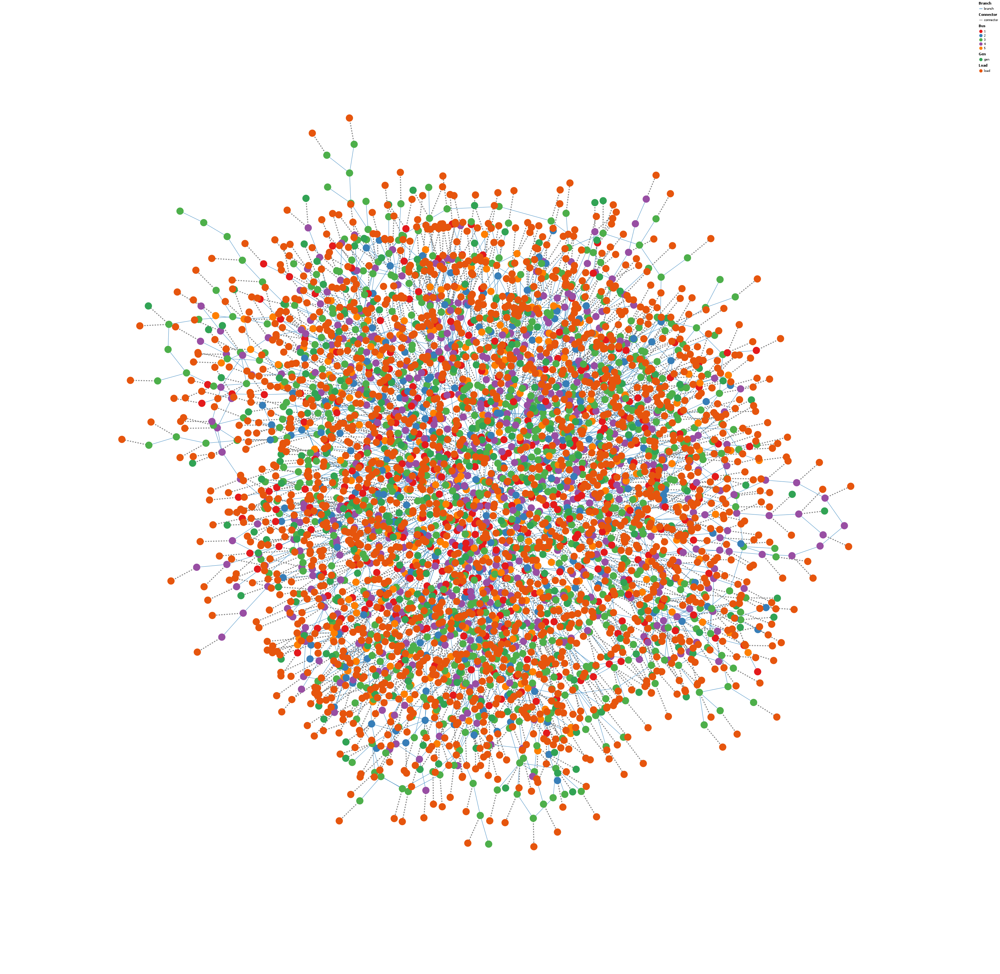

In [14]:
using PowerPlots
# Plot using spring layout with stronger repulsion (larger k)
plot = powerplot(island_sys;
    width = 3000,
    height = 3000,
    fixed = false,                         # allow layout algorithm to move nodes
    branch = (:size => 1),
    bus = (
      :data => :zone,
      :data_type => :nominal,
      :color => ["#e41a1c", "#377eb8", "#4daf4a", "#984ea3", "#ff7f00", "#00ffff"]
    )
)
display(plot)
